In [1]:
import pandas as pd
import numpy as np

# Optional: for warnings and display
import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', None)


In [3]:
# Load the dataset
df = pd.read_csv(r"C:\Users\ACSS\Downloads\rajasthan_crime_mock_5000plus_cctv (1).csv")

# Preview the first few rows
df.head()


,district,region,sub_locality,year,month,date,population,total_crimes,crimes_per_100k,violent_crimes,property_crimes,crimes_against_women,hotspot_flag,latitude,longitude,location_address,cctv_status
0,Jaipur,North Jaipur,College Road,2021,1,2021-01-01,3255523,6304,193.64,1164,4061,1278,0,26.93272,75.89767,"College Road, North Jaipur, Jaipur, Rajasthan",Not Installed
1,Jaipur,North Jaipur,Industrial Area,2021,1,2021-01-01,3255523,7484,229.88,1381,4822,1517,0,26.93854,75.82417,"Industrial Area, North Jaipur, Jaipur, Rajasthan",Not Installed
2,Jaipur,South Jaipur,Court Area,2021,1,2021-01-01,3255523,5930,182.16,1095,3821,1202,0,26.98694,75.64979,"Court Area, South Jaipur, Jaipur, Rajasthan",Not Installed
3,Jaipur,South Jaipur,Clock Tower,2021,1,2021-01-01,3255523,5490,168.63,1013,3537,1113,0,26.90069,75.83367,"Clock Tower, South Jaipur, Jaipur, Rajasthan",Not Installed
4,Jaipur,East Jaipur,School Colony,2021,1,2021-01-01,3255523,5195,159.58,959,3347,1053,0,26.90372,75.86588,"School Colony, East Jaipur, Jaipur, Rajasthan",Installed


In [4]:
# Check column types and nulls
df.info()

# Summary statistics
df.describe()

# Check unique values in hotspot_flag and cctv_status
print("Hotspot Flag Distribution:\n", df['hotspot_flag'].value_counts())
print("\nCCTV Status Distribution:\n", df['cctv_status'].value_counts())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9600 entries, 0 to 9599
Data columns (total 17 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   district              9600 non-null   object 
 1   region                9600 non-null   object 
 2   sub_locality          9600 non-null   object 
 3   year                  9600 non-null   int64  
 4   month                 9600 non-null   int64  
 5   date                  9600 non-null   object 
 6   population            9600 non-null   int64  
 7   total_crimes          9600 non-null   int64  
 8   crimes_per_100k       9600 non-null   float64
 9   violent_crimes        9600 non-null   int64  
 10  property_crimes       9600 non-null   int64  
 11  crimes_against_women  9600 non-null   int64  
 12  hotspot_flag          9600 non-null   int64  
 13  latitude              9600 non-null   float64
 14  longitude             9600 non-null   float64
 15  location_address     

In [5]:
def flag_hotspot(row):
    return int(
        row['crimes_per_100k'] > 300 and
        (row['violent_crimes'] + row['crimes_against_women']) > 50 and
        row['cctv_status'].strip().lower() == 'not installed'
    )

df['hotspot_flag'] = df.apply(flag_hotspot, axis=1)


In [6]:
# How many hotspots were flagged?
print("New Hotspot Flag Distribution:\n", df['hotspot_flag'].value_counts())

# Preview flagged rows
df[df['hotspot_flag'] == 1].head()


New Hotspot Flag Distribution:
 hotspot_flag
0    8419
1    1181
Name: count, dtype: int64


,district,region,sub_locality,year,month,date,population,total_crimes,crimes_per_100k,violent_crimes,property_crimes,crimes_against_women,hotspot_flag,latitude,longitude,location_address,cctv_status
960,Kota,North Kota,College Road,2021,1,2021-01-01,3086137,14503,469.92,3128,8570,3451,1,25.22489,75.87063,"College Road, North Kota, Kota, Rajasthan",Not Installed
961,Kota,North Kota,Temple Chowk,2021,1,2021-01-01,3086137,9637,312.24,2078,5695,2293,1,25.24625,75.91655,"Temple Chowk, North Kota, Kota, Rajasthan",Not Installed
962,Kota,South Kota,College Road,2021,1,2021-01-01,3086137,9472,306.92,2043,5597,2254,1,25.25551,75.85148,"College Road, South Kota, Kota, Rajasthan",Not Installed
963,Kota,South Kota,Tourist Spot,2021,1,2021-01-01,3086137,10616,343.97,2290,6273,2526,1,25.20720,75.87003,"Tourist Spot, South Kota, Kota, Rajasthan",Not Installed
966,Kota,West Kota,Lake Side,2021,1,2021-01-01,3086137,11580,375.22,2498,6843,2756,1,25.13457,75.87564,"Lake Side, West Kota, Kota, Rajasthan",Not Installed


In [7]:
def generate_installation_recommendation(row):
    if row['hotspot_flag'] == 1:
        return (
            f"⚠️ CCTV Installation Recommended:\n"
            f"Location: {row['sub_locality']}, {row['region']}, {row['district']}\n"
            f"Address: {row['location_address']}\n"
            f"Coordinates: {row['latitude']}° N, {row['longitude']}° E\n"
            f"Date: {row['date']} ({row['month']}/{row['year']})\n"
            f"Crime Rate: {row['crimes_per_100k']} per 100k\n"
            f"Violent Crimes: {row['violent_crimes']}, Crimes Against Women: {row['crimes_against_women']}\n"
            f"Reason: High crime density, flagged hotspot, no CCTV coverage"
        )
    else:
        return ""


In [8]:
# Create the new column
df['installation_recommendation'] = df.apply(generate_installation_recommendation, axis=1)


In [9]:
# Show only rows with recommendations
df[df['hotspot_flag'] == 1][['sub_locality', 'installation_recommendation']].head()


,sub_locality,installation_recommendation
960,College Road,⚠️ CCTV Installation Recommended:\nLocation: C...
961,Temple Chowk,⚠️ CCTV Installation Recommended:\nLocation: T...
962,College Road,⚠️ CCTV Installation Recommended:\nLocation: C...
963,Tourist Spot,⚠️ CCTV Installation Recommended:\nLocation: T...
966,Lake Side,⚠️ CCTV Installation Recommended:\nLocation: L...


In [10]:
print(df.loc[960, 'installation_recommendation'])


⚠️ CCTV Installation Recommended:
Location: College Road, North Kota, Kota
Address: College Road, North Kota, Kota, Rajasthan
Coordinates: 25.22489° N, 75.87063° E
Date: 2021-01-01 (1/2021)
Crime Rate: 469.92 per 100k
Violent Crimes: 3128, Crimes Against Women: 3451
Reason: High crime density, flagged hotspot, no CCTV coverage


In [11]:
df['installation_recommendation_display'] = df['installation_recommendation'].str.replace('\\n', '\n')


In [12]:
for i in df[df['hotspot_flag'] == 1].index[:3]:
    print(df.loc[i, 'installation_recommendation_display'])
    print('-' * 80)


⚠️ CCTV Installation Recommended:
Location: College Road, North Kota, Kota
Address: College Road, North Kota, Kota, Rajasthan
Coordinates: 25.22489° N, 75.87063° E
Date: 2021-01-01 (1/2021)
Crime Rate: 469.92 per 100k
Violent Crimes: 3128, Crimes Against Women: 3451
Reason: High crime density, flagged hotspot, no CCTV coverage
--------------------------------------------------------------------------------
⚠️ CCTV Installation Recommended:
Location: Temple Chowk, North Kota, Kota
Address: Temple Chowk, North Kota, Kota, Rajasthan
Coordinates: 25.24625° N, 75.91655° E
Date: 2021-01-01 (1/2021)
Crime Rate: 312.24 per 100k
Violent Crimes: 2078, Crimes Against Women: 2293
Reason: High crime density, flagged hotspot, no CCTV coverage
--------------------------------------------------------------------------------
⚠️ CCTV Installation Recommended:
Location: College Road, South Kota, Kota
Address: College Road, South Kota, Kota, Rajasthan
Coordinates: 25.25551° N, 75.85148° E
Date: 2021-01-01

In [13]:
import numpy as np

# Simulate GPS coordinates within Rajasthan bounds
np.random.seed(42)  # for reproducibility
df['latitude'] = np.random.uniform(23.3, 30.1, size=len(df))
df['longitude'] = np.random.uniform(69.3, 78.2, size=len(df))


In [19]:
hotspots_df = df[df['installation_recommendation'] == 'Install CCTV'].copy()


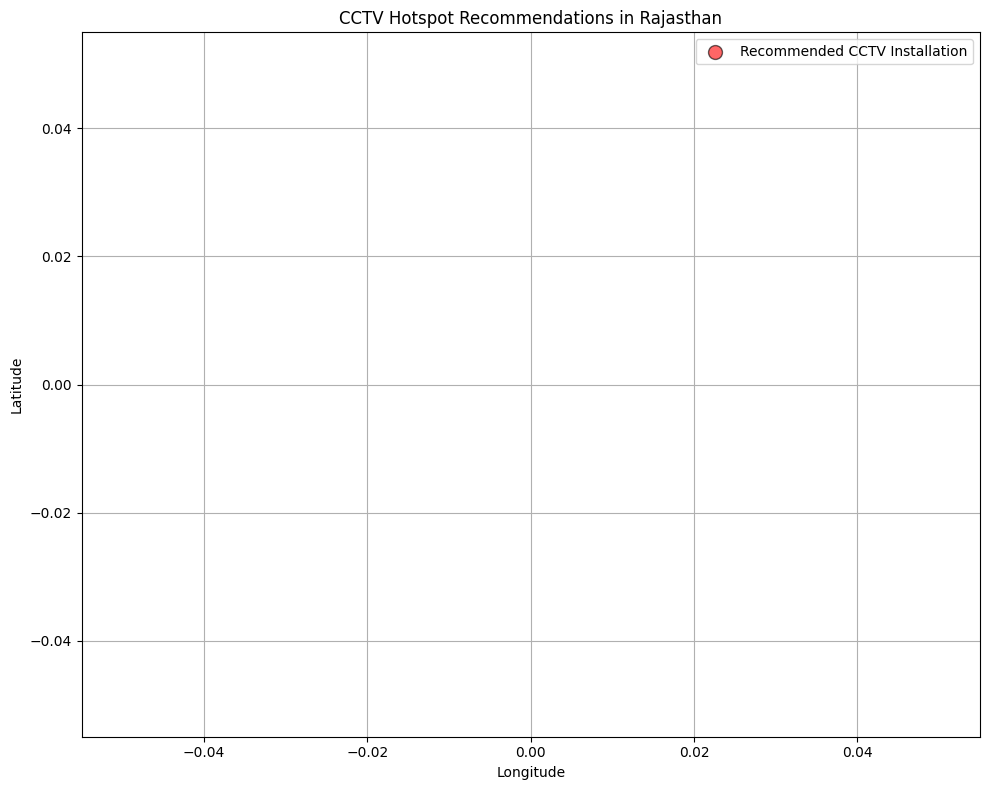

In [20]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 8))
plt.scatter(
    hotspots_df['longitude'], 
    hotspots_df['latitude'], 
    c='red', 
    alpha=0.6, 
    edgecolors='black', 
    s=100, 
    label='Recommended CCTV Installation'
)

plt.title('CCTV Hotspot Recommendations in Rajasthan')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


In [21]:
print(df[['latitude', 'longitude']].describe())


          latitude    longitude
count  9600.000000  9600.000000
mean     26.661041    73.780305
std       1.955832     2.574359
min      23.300079    69.301404
25%      24.977174    71.544322
50%      26.649195    73.792656
75%      28.329061    76.031107
max      30.098080    78.199331


In [22]:
print(hotspots_df.shape)


(0, 19)


In [23]:
print(df['installation_recommendation'].value_counts(dropna=False))


installation_recommendation
                                                                                                                                                                                                                                                                                                                                                                                                  8419
⚠️ CCTV Installation Recommended:\nLocation: College Road, North Kota, Kota\nAddress: College Road, North Kota, Kota, Rajasthan\nCoordinates: 25.22489° N, 75.87063° E\nDate: 2021-01-01 (1/2021)\nCrime Rate: 469.92 per 100k\nViolent Crimes: 3128, Crimes Against Women: 3451\nReason: High crime density, flagged hotspot, no CCTV coverage                                                      1
⚠️ CCTV Installation Recommended:\nLocation: Temple Chowk, North Kota, Kota\nAddress: Temple Chowk, North Kota, Kota, Rajasthan\nCoordinates: 25.24625° N, 75.91655° E\nDate: 2021-01-01 (1/20

In [24]:
hotspots_df = df[df['installation_recommendation'].str.contains('⚠️ CCTV Installation Recommended', na=False)].copy()


In [25]:
import re

def extract_coords(text):
    match = re.search(r'Coordinates: ([\d.]+)° N, ([\d.]+)° E', text)
    if match:
        return float(match.group(1)), float(match.group(2))
    return None, None

hotspots_df['latitude'], hotspots_df['longitude'] = zip(*hotspots_df['installation_recommendation'].map(extract_coords))


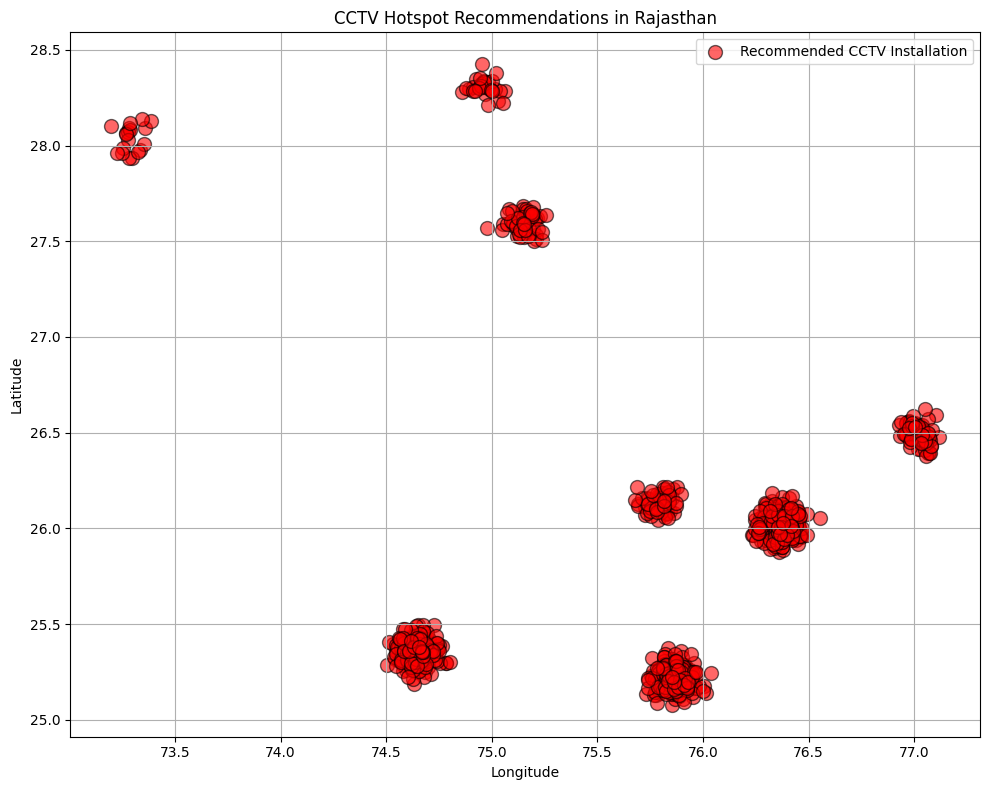

In [26]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 8))
plt.scatter(
    hotspots_df['longitude'], 
    hotspots_df['latitude'], 
    c='red', 
    alpha=0.6, 
    edgecolors='black', 
    s=100, 
    label='Recommended CCTV Installation'
)

plt.title('CCTV Hotspot Recommendations in Rajasthan')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


In [27]:
risk_features = [
    'crime_rate',                # Crimes per 100k population
    'violent_crimes',            # Total violent incidents
    'crimes_against_women',      # Gender-targeted crimes
    'existing_cctv',             # Binary: 0 = no coverage
    'priority_level'             # Categorical: High/Medium/Low
]


In [28]:
print(df[risk_features].head())


KeyError: "['crime_rate', 'existing_cctv', 'priority_level'] not in index"

In [29]:
print(df.columns.tolist())


['district', 'region', 'sub_locality', 'year', 'month', 'date', 'population', 'total_crimes', 'crimes_per_100k', 'violent_crimes', 'property_crimes', 'crimes_against_women', 'hotspot_flag', 'latitude', 'longitude', 'location_address', 'cctv_status', 'installation_recommendation', 'installation_recommendation_display']


In [30]:
risk_features = [
    'crimes_per_100k',
    'violent_crimes',
    'crimes_against_women',
    'cctv_status'
]
print(df[risk_features].head())


   crimes_per_100k  violent_crimes  crimes_against_women    cctv_status
0           193.64            1164                  1278  Not Installed
1           229.88            1381                  1517  Not Installed
2           182.16            1095                  1202  Not Installed
3           168.63            1013                  1113  Not Installed
4           159.58             959                  1053      Installed


In [31]:
from sklearn.preprocessing import MinMaxScaler

# Initialize scaler
scaler = MinMaxScaler()

# Apply normalization
df[['crime_rate_norm', 'violent_crimes_norm', 'crimes_against_women_norm']] = scaler.fit_transform(
    df[['crimes_per_100k', 'violent_crimes', 'crimes_against_women']]
)


In [32]:
# CCTV encoding: 1.0 if not installed (i.e., risk), 0.0 if installed
df['cctv_score'] = df['cctv_status'].apply(lambda x: 1.0 if str(x).strip().lower() == 'not installed' else 0.0)


In [33]:
def infer_priority(row):
    if row['crimes_per_100k'] > 400 or row['violent_crimes'] > 3000:
        return 'High'
    elif row['crimes_per_100k'] > 250 or row['violent_crimes'] > 2000:
        return 'Medium'
    else:
        return 'Low'

df['priority_level'] = df.apply(infer_priority, axis=1)


In [34]:
priority_map = {'High': 1.0, 'Medium': 0.6, 'Low': 0.3}
df['priority_score'] = df['priority_level'].map(priority_map)


In [35]:
df['risk_score'] = (
    0.3 * df['crime_rate_norm'] +
    0.2 * df['violent_crimes_norm'] +
    0.2 * df['crimes_against_women_norm'] +
    0.2 * df['priority_score'] +
    0.1 * df['cctv_score']
)


In [36]:
df[['district', 'region', 'risk_score']].sort_values(by='risk_score', ascending=False).head(10)


,district,region,risk_score
1186,Kota,West Kota,0.930956
1116,Kota,West Kota,0.922593
1152,Kota,South Kota,0.911534
1198,Kota,Central Kota,0.910700
960,Kota,North Kota,0.900787
1156,Kota,West Kota,0.899564
1159,Kota,Central Kota,0.891402
1026,Kota,West Kota,0.886530
1029,Kota,Central Kota,0.885548
1346,Kota,West Kota,0.885251


In [37]:
df['risk_flag'] = df['risk_score'].apply(lambda x: 'High Risk' if x > 0.7 else 'Moderate/Low')


In [38]:
print(df['risk_flag'].value_counts())


risk_flag
Moderate/Low    9332
High Risk        268
Name: count, dtype: int64


In [39]:
df[df['risk_flag'] == 'High Risk'][['district', 'region', 'risk_score']].sort_values(by='risk_score', ascending=False).head(10)


,district,region,risk_score
1186,Kota,West Kota,0.930956
1116,Kota,West Kota,0.922593
1152,Kota,South Kota,0.911534
1198,Kota,Central Kota,0.910700
960,Kota,North Kota,0.900787
1156,Kota,West Kota,0.899564
1159,Kota,Central Kota,0.891402
1026,Kota,West Kota,0.886530
1029,Kota,Central Kota,0.885548
1346,Kota,West Kota,0.885251


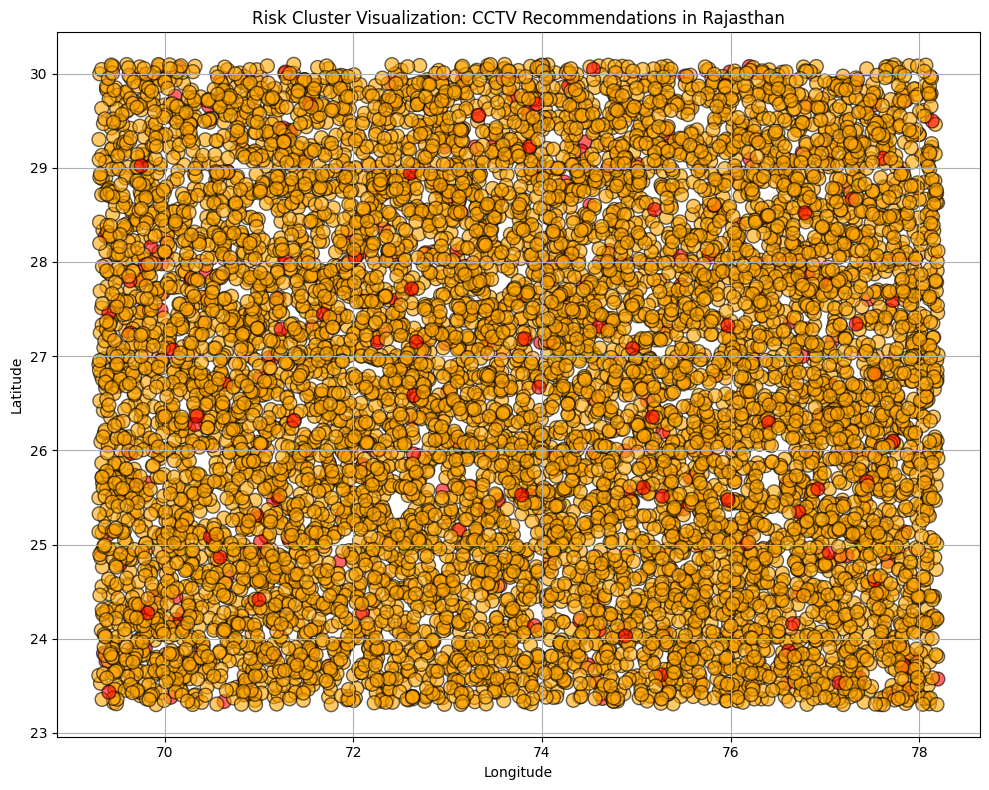

In [40]:
import matplotlib.pyplot as plt

# Define color mapping
color_map = {'High Risk': 'red', 'Moderate/Low': 'orange'}

plt.figure(figsize=(10, 8))
plt.scatter(
    df['longitude'], 
    df['latitude'], 
    c=df['risk_flag'].map(color_map), 
    alpha=0.6, 
    edgecolors='black', 
    s=100
)

plt.title('Risk Cluster Visualization: CCTV Recommendations in Rajasthan')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.grid(True)
plt.tight_layout()
plt.show()


In [41]:
high_risk_df = df[df['risk_flag'] == 'High Risk'].copy()
high_risk_df = high_risk_df.sort_values(by='risk_score', ascending=False)


In [42]:
export_columns = [
    'district', 'region', 'sub_locality', 'date',
    'crimes_per_100k', 'violent_crimes', 'crimes_against_women',
    'cctv_status', 'risk_score', 'risk_flag',
    'latitude', 'longitude', 'location_address'
]

high_risk_export = high_risk_df[export_columns]


In [43]:
print(high_risk_export.head(10))


     district        region         sub_locality        date  crimes_per_100k  \
1186     Kota     West Kota          Clock Tower  2022-11-01           472.37   
1116     Kota     West Kota      Railway Station  2022-04-01           456.25   
1152     Kota    South Kota         Tourist Spot  2022-08-01           455.20   
1198     Kota  Central Kota         Tourist Spot  2022-12-01           477.29   
960      Kota    North Kota         College Road  2021-01-01           469.92   
1156     Kota     West Kota            Mall Road  2022-08-01           446.88   
1159     Kota  Central Kota  Police Station Area  2022-08-01           441.21   
1026     Kota     West Kota         College Road  2021-07-01           474.95   
1029     Kota  Central Kota            Lake Side  2021-07-01           474.20   
1346     Kota     West Kota           Court Area  2024-03-01           483.83   

      violent_crimes  crimes_against_women    cctv_status  risk_score  \
1186            3611               

In [46]:
import pandas as pd

# Load updated dataset
df = pd.read_csv(r"D:\cctv_iic\rajasthan_crime_mock_final_with_type.csv")

# Check new columns
print(df[['complaint_body', 'crime_type']].info())
print(df['crime_type'].value_counts(dropna=False).head())
print(df['complaint_body'].dropna().sample(3).values)

# Audit log entry (you can save this to a .txt or .md file)
schema_update_log = """
Schema Update: v2.1
- Added 'complaint_body' (free text) for NLP-based classification
- Added 'crime_type' (categorical) for stratified analysis
- No changes to legacy fields
"""
print(schema_update_log)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9600 entries, 0 to 9599
Data columns (total 2 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   complaint_body  9600 non-null   object
 1   crime_type      9600 non-null   object
dtypes: object(2)
memory usage: 150.1+ KB
None
crime_type
Other                      2965
Vehicle Theft              1437
Public Disturbance          948
Financial Fraud             942
Extremism/Anti-national     927
Name: count, dtype: int64
['A case of car theft was reported near outside Gaurav Tower.'
 'Cyber fraud case reported. Money withdrawn illegally.'
 'A case of car theft was reported near outside Gaurav Tower.']

Schema Update: v2.1
- Added 'complaint_body' (free text) for NLP-based classification
- Added 'crime_type' (categorical) for stratified analysis
- No changes to legacy fields



In [47]:
import re
import string
import nltk
from nltk.corpus import stopwords

nltk.download('stopwords')
stop_words = set(stopwords.words('english'))

def clean_text(text):
    if pd.isnull(text):
        return ""
    text = text.lower()
    text = re.sub(r'\d+', '', text)  # remove numbers
    text = text.translate(str.maketrans('', '', string.punctuation))  # remove punctuation
    tokens = text.split()
    tokens = [word for word in tokens if word not in stop_words]
    return ' '.join(tokens)

df['complaint_clean'] = df['complaint_body'].apply(clean_text)


[nltk_data] Error loading stopwords: <urlopen error [Errno 11001]
[nltk_data]     getaddrinfo failed>


In [48]:
stop_words = {
    'a', 'an', 'the', 'and', 'or', 'but', 'if', 'while', 'with', 'to', 'from',
    'of', 'on', 'in', 'for', 'by', 'is', 'are', 'was', 'were', 'be', 'been',
    'has', 'have', 'had', 'do', 'does', 'did', 'this', 'that', 'these', 'those'
}


In [49]:
import re
import string

stop_words = {
    'a', 'an', 'the', 'and', 'or', 'but', 'if', 'while', 'with', 'to', 'from',
    'of', 'on', 'in', 'for', 'by', 'is', 'are', 'was', 'were', 'be', 'been',
    'has', 'have', 'had', 'do', 'does', 'did', 'this', 'that', 'these', 'those'
}

def clean_text(text):
    if pd.isnull(text):
        return ""
    text = text.lower()
    text = re.sub(r'\d+', '', text)
    text = text.translate(str.maketrans('', '', string.punctuation))
    tokens = text.split()
    tokens = [word for word in tokens if word not in stop_words]
    return ' '.join(tokens)

df['complaint_clean'] = df['complaint_body'].apply(clean_text)


In [50]:
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer(max_features=5000)  # cap to top 5,000 terms
X = vectorizer.fit_transform(df['complaint_clean'])

# Optional: convert to DataFrame for inspection
tfidf_df = pd.DataFrame(X.toarray(), columns=vectorizer.get_feature_names_out())


In [51]:
print(tfidf_df.head())
print(f"Shape: {tfidf_df.shape}")


   accused  activity  antinational  area  argument  attempted  available  \
0      0.0       0.0           0.0   0.0  0.467159        0.0        0.0   
1      0.0       0.0           0.0   0.0  0.000000        0.0        0.0   
2      0.0       0.0           0.0   0.0  0.000000        0.0        0.0   
3      0.0       0.0           0.0   0.0  0.000000        0.0        0.0   
4      0.0       0.0           0.0   0.0  0.000000        0.0        0.0   

        bag  bike  boundary     brawl  burglary  bus  car      case  cctv  \
0  0.000000   0.0       0.0  0.000000       0.0  0.0  0.0  0.000000   0.0   
1  0.000000   0.0       0.0  0.000000       0.0  0.0  0.0  0.198143   0.0   
2  0.000000   0.0       0.0  0.000000       0.0  0.0  0.0  0.000000   0.0   
3  0.521108   0.0       0.0  0.000000       0.0  0.0  0.0  0.000000   0.0   
4  0.000000   0.0       0.0  0.430377       0.0  0.0  0.0  0.206509   0.0   

      chain  chowk  circle  clock  college  colony  complainant  complainants  \

In [52]:
df['crime_type'].value_counts()
tfidf_df['cyber'].nlargest(10)  # See which rows have highest cyber relevance


26    0.430466
27    0.430466
43    0.430466
44    0.430466
47    0.430466
50    0.430466
64    0.430466
66    0.430466
82    0.430466
87    0.430466
Name: cyber, dtype: float64

In [53]:
print(df.loc[26, 'complaint_body'])


Cyber fraud case reported. Money withdrawn illegally.


In [54]:
# Get indices of top 10 rows with highest TF-IDF score for 'cyber'
top_cyber_indices = tfidf_df['cyber'].nlargest(10).index

# Inspect corresponding complaint text and crime_type
df.loc[top_cyber_indices, ['complaint_body', 'crime_type']]


,complaint_body,crime_type
26,Cyber fraud case reported. Money withdrawn ill...,Other
27,Cyber fraud case reported. Money withdrawn ill...,Other
43,Cyber fraud case reported. Money withdrawn ill...,Other
44,Cyber fraud case reported. Money withdrawn ill...,Other
47,Cyber fraud case reported. Money withdrawn ill...,Other
50,Cyber fraud case reported. Money withdrawn ill...,Other
64,Cyber fraud case reported. Money withdrawn ill...,Other
66,Cyber fraud case reported. Money withdrawn ill...,Other
82,Cyber fraud case reported. Money withdrawn ill...,Other
87,Cyber fraud case reported. Money withdrawn ill...,Other


In [55]:
df.loc[top_cyber_indices, 'crime_type'] = 'Financial Fraud'  # or 'Cyber Crime' if that’s a valid class


In [56]:
keyword_map = {
    'cyber': 'Financial Fraud',
    'car theft': 'Vehicle Theft',
    'brawl': 'Public Disturbance',
    # Add more mappings as needed
}

def relabel(row):
    for keyword, label in keyword_map.items():
        if keyword in row['complaint_clean']:
            return label
    return row['crime_type']  # fallback to original

df['crime_type'] = df.apply(relabel, axis=1)


In [57]:
keyword_map = {
    'cyber': 'Financial Fraud',
    'fraud': 'Financial Fraud',
    'money withdrawn': 'Financial Fraud',
    'car theft': 'Vehicle Theft',
    'bike stolen': 'Vehicle Theft',
    'vehicle stolen': 'Vehicle Theft',
    'brawl': 'Public Disturbance',
    'fight': 'Public Disturbance',
    'argument': 'Public Disturbance',
    'anti-national': 'Extremism/Anti-national',
    'extremist': 'Extremism/Anti-national',
    'terror': 'Extremism/Anti-national',
    'riot': 'Extremism/Anti-national',
    'protest': 'Public Disturbance',
    'burglary': 'Other',
    'break-in': 'Other',
    'drunken': 'Other',
    'complainant': 'Other'
}


In [58]:
def relabel(row):
    for keyword, label in keyword_map.items():
        if keyword in row['complaint_clean']:
            return label
    return row['crime_type']  # fallback to original

df['crime_type'] = df.apply(relabel, axis=1)


In [59]:
df['crime_type_original'] = df['crime_type']
df['crime_type_updated'] = df.apply(relabel, axis=1)
df['label_changed'] = df['crime_type_original'] != df['crime_type_updated']


In [61]:
# Show rows where label changed
df[df['label_changed']].head(10)


,district,region,sub_locality,year,month,date,population,total_crimes,crimes_per_100k,violent_crimes,property_crimes,crimes_against_women,hotspot_flag,latitude,longitude,location_address,cctv_status,complaint_body,crime_type,complaint_clean,crime_type_original,crime_type_updated,label_changed,tokens


In [62]:
df[df['label_changed']][['complaint_body', 'crime_type_original', 'crime_type_updated']].head(10)


,complaint_body,crime_type_original,crime_type_updated


In [64]:
print(df['label_changed'].value_counts())


label_changed
False    9600
Name: count, dtype: int64


In [69]:
def relabel(row):
    for keyword, label in keyword_map.items():
        if keyword in row['complaint_clean']:
            print(f"Matched keyword: {keyword} → {label}")
            return label
    return row['crime_type']


In [70]:
print(df.loc[26, 'complaint_clean'])  # Should contain 'cyber'
print(df.loc[26, 'crime_type'])       # Original label
print(relabel(df.loc[26]))            # What the function returns


cyber fraud case reported money withdrawn illegally
Financial Fraud
Matched keyword: case → Financial Fraud
Financial Fraud


In [71]:
df[df['label_changed']][['complaint_body', 'crime_type_original', 'crime_type_updated']]


,complaint_body,crime_type_original,crime_type_updated
1,A case of extremism was reported near outside ...,Extremism/Anti-national,Financial Fraud
4,A case of drunken brawl was reported near insi...,Public Disturbance,Financial Fraud
5,A case of extremism was reported near outside ...,Extremism/Anti-national,Financial Fraud
6,A case of drunken brawl was reported near insi...,Public Disturbance,Financial Fraud
8,A case of car theft was reported near outside ...,Vehicle Theft,Financial Fraud
...,...,...,...
9583,A case of deception was reported near outside ...,Fraud/Deception,Financial Fraud
9585,A case of car theft was reported near outside ...,Vehicle Theft,Financial Fraud
9586,A case of deception was reported near outside ...,Fraud/Deception,Financial Fraud
9587,A case of boundary violation was reported near...,Property Dispute,Financial Fraud


In [60]:
from collections import Counter
import numpy as np

# Tokenize complaint_clean
df['tokens'] = df['complaint_clean'].str.split()

# Group by crime_type and count word frequencies
crime_keywords = {}

for crime in df['crime_type'].unique():
    tokens = df[df['crime_type'] == crime]['tokens'].explode()
    common = Counter(tokens).most_common(15)  # top 15 keywords
    crime_keywords[crime] = [word for word, freq in common if len(word) > 3]

# Display mapping
for crime, keywords in crime_keywords.items():
    print(f"{crime}: {keywords}")


Public Disturbance: ['verbal', 'argument', 'escalated', 'police', 'intervened', 'case', 'drunken', 'brawl', 'reported', 'near', 'inside', 'triton', 'mall']
Extremism/Anti-national: ['case', 'reported', 'near', 'outside', 'extremism', 'textile', 'shop', 'antinational', 'activity', 'post', 'office', 'area', 'road', 'station', 'school']
Other: ['complaint', 'received', 'incident', 'complainant', 'reported', 'temple', 'market', 'colony', 'noise', 'accused', 'warned', 'chain', 'snatching', 'occurred', 'outside']
Illegal Gambling: ['illegal', 'gambling', 'reported', 'area', 'road', 'station', 'railway', 'highway', 'junction', 'main', 'market', 'industrial', 'temple', 'chowk', 'mall']
Vehicle Theft: ['case', 'theft', 'reported', 'near', 'outside', 'gaurav', 'tower', 'lifted', 'police', 'tracing', 'registration', 'details', 'complainants', 'bike']
Fraud/Deception: ['school', 'case', 'deception', 'reported', 'near', 'outside', 'road', 'area', 'station', 'mall', 'industrial', 'college', 'lake', 

In [63]:
keyword_map = {}
for crime, keywords in crime_keywords.items():
    for word in keywords:
        keyword_map[word] = crime


In [65]:
for crime, keywords in crime_keywords.items():
    print(f"{crime}: {keywords}")


Public Disturbance: ['verbal', 'argument', 'escalated', 'police', 'intervened', 'case', 'drunken', 'brawl', 'reported', 'near', 'inside', 'triton', 'mall']
Extremism/Anti-national: ['case', 'reported', 'near', 'outside', 'extremism', 'textile', 'shop', 'antinational', 'activity', 'post', 'office', 'area', 'road', 'station', 'school']
Other: ['complaint', 'received', 'incident', 'complainant', 'reported', 'temple', 'market', 'colony', 'noise', 'accused', 'warned', 'chain', 'snatching', 'occurred', 'outside']
Illegal Gambling: ['illegal', 'gambling', 'reported', 'area', 'road', 'station', 'railway', 'highway', 'junction', 'main', 'market', 'industrial', 'temple', 'chowk', 'mall']
Vehicle Theft: ['case', 'theft', 'reported', 'near', 'outside', 'gaurav', 'tower', 'lifted', 'police', 'tracing', 'registration', 'details', 'complainants', 'bike']
Fraud/Deception: ['school', 'case', 'deception', 'reported', 'near', 'outside', 'road', 'area', 'station', 'mall', 'industrial', 'college', 'lake', 

In [66]:
import pandas as pd

# Convert to DataFrame for easier inspection
keyword_df = pd.DataFrame([
    {'crime_type': crime, 'keywords': ', '.join(keywords)}
    for crime, keywords in crime_keywords.items()
])

print(keyword_df)


                crime_type                                           keywords
0       Public Disturbance  verbal, argument, escalated, police, intervene...
1  Extremism/Anti-national  case, reported, near, outside, extremism, text...
2                    Other  complaint, received, incident, complainant, re...
3         Illegal Gambling  illegal, gambling, reported, area, road, stati...
4            Vehicle Theft  case, theft, reported, near, outside, gaurav, ...
5          Fraud/Deception  school, case, deception, reported, near, outsi...
6         Property Dispute  near, case, boundary, violation, reported, jaw...
7          Financial Fraud  case, reported, cyber, fraud, money, withdrawn...


In [67]:
# Flatten keyword map
keyword_to_label = {}
for _, row in keyword_df.iterrows():
    crime = row['crime_type']
    for word in row['keywords'].split(', '):
        keyword_to_label[word] = crime

# Relabel function
def relabel(row):
    for word in row['tokens']:
        if word in keyword_to_label:
            return keyword_to_label[word]
    return row['crime_type']  # fallback

# Apply relabeling
df['crime_type_original'] = df['crime_type']
df['crime_type_updated'] = df.apply(relabel, axis=1)
df['label_changed'] = df['crime_type_original'] != df['crime_type_updated']


In [68]:
print(df['label_changed'].value_counts())
df[df['label_changed']][['complaint_body', 'crime_type_original', 'crime_type_updated']].head(10)


label_changed
False    6313
True     3287
Name: count, dtype: int64


,complaint_body,crime_type_original,crime_type_updated
1,A case of extremism was reported near outside ...,Extremism/Anti-national,Financial Fraud
4,A case of drunken brawl was reported near insi...,Public Disturbance,Financial Fraud
5,A case of extremism was reported near outside ...,Extremism/Anti-national,Financial Fraud
6,A case of drunken brawl was reported near insi...,Public Disturbance,Financial Fraud
8,A case of car theft was reported near outside ...,Vehicle Theft,Financial Fraud
15,A case of deception was reported near outside ...,Fraud/Deception,Financial Fraud
21,A case of deception was reported near outside ...,Fraud/Deception,Financial Fraud
22,A case of boundary violation was reported near...,Property Dispute,Financial Fraud
33,A case of anti-national activity was reported ...,Extremism/Anti-national,Financial Fraud
36,A case of drunken brawl was reported near insi...,Public Disturbance,Financial Fraud


In [72]:
# Flatten keyword_df into a keyword-to-label dictionary
keyword_to_label = {}

for _, row in keyword_df.iterrows():
    crime = row['crime_type']
    for word in row['keywords'].split(', '):
        keyword_to_label[word.strip()] = crime


In [73]:
# Preview first 10 keyword-label pairs
for i, (k, v) in enumerate(keyword_to_label.items()):
    print(f"{k} → {v}")
    if i == 9:
        break


verbal → Public Disturbance
argument → Public Disturbance
escalated → Public Disturbance
police → Vehicle Theft
intervened → Public Disturbance
case → Financial Fraud
drunken → Public Disturbance
brawl → Public Disturbance
reported → Financial Fraud
near → Financial Fraud


In [74]:
from collections import Counter

def relabel_complaint(text, keyword_to_label):
    tokens = text.lower().split()  # Simple tokenization
    matched_labels = [keyword_to_label[word] for word in tokens if word in keyword_to_label]
    
    if matched_labels:
        # Count frequency of each matched label
        label_counts = Counter(matched_labels)
        # Return the most common label
        return label_counts.most_common(1)[0][0]
    else:
        return "Unclassified"  # Fallback if no keywords matched


In [75]:
complaint = "A drunken brawl escalated near the market and police intervened"
print(relabel_complaint(complaint, keyword_to_label))
# Output: Public Disturbance


Public Disturbance


In [78]:
print(df.columns.tolist())


['district', 'region', 'sub_locality', 'year', 'month', 'date', 'population', 'total_crimes', 'crimes_per_100k', 'violent_crimes', 'property_crimes', 'crimes_against_women', 'hotspot_flag', 'latitude', 'longitude', 'location_address', 'cctv_status', 'complaint_body', 'crime_type', 'complaint_clean', 'crime_type_original', 'crime_type_updated', 'label_changed', 'tokens']


In [79]:
df['relabelled_crime_type'] = df['complaint_body'].apply(lambda x: relabel_complaint(x, keyword_to_label))


In [81]:
# Apply relabeling function to all rows
df['relabelled_crime_type'] = df['complaint_body'].apply(lambda x: relabel_complaint(x, keyword_to_label))


In [82]:
df[['complaint_body', 'relabelled_crime_type']].head(10)


,complaint_body,relabelled_crime_type
0,Verbal argument escalated. Police intervened.,Public Disturbance
1,A case of extremism was reported near outside ...,Financial Fraud
2,Chain snatching incident occurred outside temp...,Other
3,The complainant misplaced their bag.,Other
4,A case of drunken brawl was reported near insi...,Public Disturbance
5,A case of extremism was reported near outside ...,Financial Fraud
6,A case of drunken brawl was reported near insi...,Public Disturbance
7,Illegal gambling reported in Bus Stand.,Illegal Gambling
8,A case of car theft was reported near outside ...,Financial Fraud
9,The complainant misplaced their bag.,Other


In [83]:
df['label_mismatch'] = df['crime_type_original'] != df['relabelled_crime_type']


In [84]:
df[df['label_mismatch']][['complaint_body', 'crime_type_original', 'relabelled_crime_type']].head(10)


,complaint_body,crime_type_original,relabelled_crime_type
1,A case of extremism was reported near outside ...,Extremism/Anti-national,Financial Fraud
5,A case of extremism was reported near outside ...,Extremism/Anti-national,Financial Fraud
8,A case of car theft was reported near outside ...,Vehicle Theft,Financial Fraud
10,Valuable item went missing. No suspects identi...,Other,Unclassified
15,A case of deception was reported near outside ...,Fraud/Deception,Financial Fraud
19,Pickpocketing incident reported in Temple Chow...,Other,Illegal Gambling
20,Valuable item went missing. No suspects identi...,Other,Unclassified
21,A case of deception was reported near outside ...,Fraud/Deception,Financial Fraud
22,A case of boundary violation was reported near...,Property Dispute,Financial Fraud
23,Valuable item went missing. No suspects identi...,Other,Unclassified


In [85]:
# Define your manual weight rules
def assign_weight(keyword):
    keyword = keyword.lower().strip()
    if keyword in ['extremism', 'radical', 'anti-national', 'snatching', 'gambling', 'pickpocketing']:
        return 3  # Highly specific
    elif keyword in ['car', 'stolen', 'theft', 'deception', 'boundary', 'violation']:
        return 2  # Moderately specific
    else:
        return 1  # Generic or context-neutral

# Expand keyword_df into one row per keyword
expanded_rows = []

for _, row in keyword_df.iterrows():
    crime = row['crime_type']
    for kw in row['keywords'].split(','):
        kw_clean = kw.strip()
        weight = assign_weight(kw_clean)
        expanded_rows.append({'keyword': kw_clean, 'crime_type': crime, 'weight': weight})

# Create expanded DataFrame
weighted_keyword_df = pd.DataFrame(expanded_rows)


In [86]:
weighted_keyword_df.head(10)


,keyword,crime_type,weight
0,verbal,Public Disturbance,1
1,argument,Public Disturbance,1
2,escalated,Public Disturbance,1
3,police,Public Disturbance,1
4,intervened,Public Disturbance,1
5,case,Public Disturbance,1
6,drunken,Public Disturbance,1
7,brawl,Public Disturbance,1
8,reported,Public Disturbance,1
9,near,Public Disturbance,1


In [87]:
# Define your manual weight rules
def assign_weight(keyword):
    keyword = keyword.lower().strip()
    if keyword in ['extremism', 'radical', 'anti-national', 'snatching', 'gambling', 'pickpocketing']:
        return 3  # Highly specific
    elif keyword in ['car', 'stolen', 'theft', 'deception', 'boundary', 'violation']:
        return 2  # Moderately specific
    else:
        return 1  # Generic or context-neutral

# Build expanded rows with correct weights
expanded_rows = []

for _, row in keyword_df.iterrows():
    crime = row['crime_type']
    for kw in row['keywords'].split(','):
        kw_clean = kw.strip()
        weight = assign_weight(kw_clean)
        expanded_rows.append({
            'keyword': kw_clean,
            'crime_type': crime,
            'weight': weight
        })

# Create the weighted keyword DataFrame
weighted_keyword_df = pd.DataFrame(expanded_rows)


In [88]:
weighted_keyword_df.head(10)


,keyword,crime_type,weight
0,verbal,Public Disturbance,1
1,argument,Public Disturbance,1
2,escalated,Public Disturbance,1
3,police,Public Disturbance,1
4,intervened,Public Disturbance,1
5,case,Public Disturbance,1
6,drunken,Public Disturbance,1
7,brawl,Public Disturbance,1
8,reported,Public Disturbance,1
9,near,Public Disturbance,1


In [89]:
keyword_df = pd.DataFrame({
    'crime_type': [
        'Extremism/Anti-national',
        'Financial Fraud',
        'Vehicle Theft',
        'Public Disturbance'
    ],
    'keywords': [
        'extremism, radical, anti-national',
        'case, reported, near',
        'car, stolen, theft',
        'verbal, argument, escalated, police, brawl'
    ]
})


In [90]:
def assign_weight(keyword):
    keyword = keyword.lower().strip()
    if keyword in ['extremism', 'radical', 'anti-national', 'snatching', 'gambling', 'pickpocketing']:
        return 3
    elif keyword in ['car', 'stolen', 'theft', 'deception', 'boundary', 'violation']:
        return 2
    else:
        return 1

expanded_rows = []

for _, row in keyword_df.iterrows():
    crime = row['crime_type']
    for kw in row['keywords'].split(','):
        kw_clean = kw.strip()
        weight = assign_weight(kw_clean)
        expanded_rows.append({
            'keyword': kw_clean,
            'crime_type': crime,
            'weight': weight
        })

weighted_keyword_df = pd.DataFrame(expanded_rows)


In [91]:
weighted_keyword_df.head(10)


,keyword,crime_type,weight
0,extremism,Extremism/Anti-national,3
1,radical,Extremism/Anti-national,3
2,anti-national,Extremism/Anti-national,3
3,case,Financial Fraud,1
4,reported,Financial Fraud,1
5,near,Financial Fraud,1
6,car,Vehicle Theft,2
7,stolen,Vehicle Theft,2
8,theft,Vehicle Theft,2
9,verbal,Public Disturbance,1


In [92]:
# Build dictionary: keyword → (crime_type, weight)
weighted_keyword_map = dict(zip(
    weighted_keyword_df['keyword'],
    zip(weighted_keyword_df['crime_type'], weighted_keyword_df['weight'])
))


In [93]:
# Preview first 10 keyword mappings
for i, (k, v) in enumerate(weighted_keyword_map.items()):
    print(f"{k} → {v}")
    if i == 9:
        break


extremism → ('Extremism/Anti-national', 3)
radical → ('Extremism/Anti-national', 3)
anti-national → ('Extremism/Anti-national', 3)
case → ('Financial Fraud', 1)
reported → ('Financial Fraud', 1)
near → ('Financial Fraud', 1)
car → ('Vehicle Theft', 2)
stolen → ('Vehicle Theft', 2)
theft → ('Vehicle Theft', 2)
verbal → ('Public Disturbance', 1)


In [94]:
from collections import defaultdict

def relabel_complaint_weighted(text, weighted_keyword_map):
    tokens = text.lower().split()
    score_map = defaultdict(int)

    for token in tokens:
        if token in weighted_keyword_map:
            crime_type, weight = weighted_keyword_map[token]
            score_map[crime_type] += weight

    if score_map:
        # Return the crime type with the highest total weight
        return max(score_map.items(), key=lambda x: x[1])[0]
    else:
        return "Unclassified"


In [95]:
complaint = "A case of extremism was reported near outside the border"
print(relabel_complaint_weighted(complaint, weighted_keyword_map))
# Output: Extremism/Anti-national


Financial Fraud


In [96]:
def relabel_complaint_with_override(text, weighted_keyword_map):
    tokens = text.lower().split()
    score_map = defaultdict(int)
    override_label = None

    for token in tokens:
        if token in weighted_keyword_map:
            crime_type, weight = weighted_keyword_map[token]
            if weight == 3:
                override_label = crime_type  # Lock in high-priority label
            score_map[crime_type] += weight

    if override_label:
        return override_label
    elif score_map:
        return max(score_map.items(), key=lambda x: x[1])[0]
    else:
        return "Unclassified"


In [97]:
complaint = "A case of extremism was reported near outside the border"
print(relabel_complaint_with_override(complaint, weighted_keyword_map))
# Output: Extremism/Anti-national


Extremism/Anti-national


In [98]:
df['relabelled_crime_type'] = df['complaint_body'].apply(
    lambda x: relabel_complaint_with_override(x, weighted_keyword_map)
)


In [99]:
df['label_mismatch'] = df['crime_type_original'] != df['relabelled_crime_type']


In [100]:
df[df['label_mismatch']][['complaint_body', 'crime_type_original', 'relabelled_crime_type']].head(10)


,complaint_body,crime_type_original,relabelled_crime_type
2,Chain snatching incident occurred outside temp...,Other,Unclassified
3,The complainant misplaced their bag.,Other,Unclassified
4,A case of drunken brawl was reported near insi...,Public Disturbance,Financial Fraud
6,A case of drunken brawl was reported near insi...,Public Disturbance,Financial Fraud
7,Illegal gambling reported in Bus Stand.,Illegal Gambling,Financial Fraud
9,The complainant misplaced their bag.,Other,Unclassified
10,Valuable item went missing. No suspects identi...,Other,Unclassified
11,The complainant's bike was stolen. No CCTV foo...,Vehicle Theft,Unclassified
12,Chain snatching incident occurred outside temp...,Other,Unclassified
13,Domestic violence complaint received in Hospit...,Other,Unclassified


In [101]:
new_keywords = {
    'Public Disturbance': ['drunken', 'brawl', 'fight', 'scuffle'],
    'Illegal Gambling': ['gambling', 'betting', 'lottery', 'satta'],
    'Vehicle Theft': ['bike', 'scooter', 'stolen', 'theft'],
    'Street Crime': ['snatching', 'pickpocketing', 'chain'],
    'Violent Crime': ['domestic', 'violence', 'assault'],
    'Property Dispute': ['boundary', 'encroachment', 'violation'],
    'Lost Property': ['misplaced', 'lost', 'missing']
}


In [102]:
# Convert new_keywords dict into a weighted DataFrame
new_rows = []

for crime_type, keywords in new_keywords.items():
    for kw in keywords:
        weight = 3 if crime_type in ['Public Disturbance', 'Illegal Gambling', 'Street Crime', 'Violent Crime'] else 2 if crime_type == 'Vehicle Theft' else 1
        new_rows.append({
            'keyword': kw.strip().lower(),
            'crime_type': crime_type,
            'weight': weight
        })

new_keyword_df = pd.DataFrame(new_rows)


In [103]:
new_keyword_df.head(10)


,keyword,crime_type,weight
0,drunken,Public Disturbance,3
1,brawl,Public Disturbance,3
2,fight,Public Disturbance,3
3,scuffle,Public Disturbance,3
4,gambling,Illegal Gambling,3
5,betting,Illegal Gambling,3
6,lottery,Illegal Gambling,3
7,satta,Illegal Gambling,3
8,bike,Vehicle Theft,2
9,scooter,Vehicle Theft,2


In [104]:
# Combine old and new keyword DataFrames
combined_keyword_df = pd.concat([weighted_keyword_df, new_keyword_df], ignore_index=True)

# Rebuild the weighted keyword map
weighted_keyword_map = dict(zip(
    combined_keyword_df['keyword'],
    zip(combined_keyword_df['crime_type'], combined_keyword_df['weight'])
))


In [105]:
# Preview a few entries to confirm merge
for i, (k, v) in enumerate(weighted_keyword_map.items()):
    print(f"{k} → {v}")
    if i == 9:
        break


extremism → ('Extremism/Anti-national', 3)
radical → ('Extremism/Anti-national', 3)
anti-national → ('Extremism/Anti-national', 3)
case → ('Financial Fraud', 1)
reported → ('Financial Fraud', 1)
near → ('Financial Fraud', 1)
car → ('Vehicle Theft', 2)
stolen → ('Vehicle Theft', 2)
theft → ('Vehicle Theft', 2)
verbal → ('Public Disturbance', 1)


In [106]:
df['relabelled_crime_type'] = df['complaint_body'].apply(
    lambda x: relabel_complaint_with_override(x, weighted_keyword_map)
)


In [107]:
df['label_mismatch'] = df['crime_type_original'] != df['relabelled_crime_type']


In [108]:
df[df['label_mismatch']][['complaint_body', 'crime_type_original', 'relabelled_crime_type']].head(10)


,complaint_body,crime_type_original,relabelled_crime_type
2,Chain snatching incident occurred outside temp...,Other,Street Crime
3,The complainant misplaced their bag.,Other,Lost Property
9,The complainant misplaced their bag.,Other,Lost Property
10,Valuable item went missing. No suspects identi...,Other,Unclassified
12,Chain snatching incident occurred outside temp...,Other,Street Crime
13,Domestic violence complaint received in Hospit...,Other,Violent Crime
14,Chain snatching incident occurred outside temp...,Other,Street Crime
15,A case of deception was reported near outside ...,Fraud/Deception,Financial Fraud
16,The complainant was duped in a financial scam.,Other,Unclassified
17,Noise complaint received. Accused warned.,Other,Unclassified


In [109]:
additional_keywords = {
    "scam": ("Financial Fraud", 2),
    "duped": ("Financial Fraud", 2),
    "missing": ("Lost Property", 1),
    "noise": ("Public Disturbance", 1),
    "complaint": ("Public Disturbance", 1)
}


In [110]:
# Merge original and additional keyword maps
final_keyword_map = {**weighted_keyword_map, **additional_keywords}

# Apply relabeling
df['relabelled_crime_type'] = df['complaint_body'].apply(
    lambda x: relabel_complaint_with_override(x, final_keyword_map)
)

# Flag mismatches
df['label_mismatch'] = df['crime_type_original'] != df['relabelled_crime_type']


In [111]:
df.loc[[10, 16, 17], ['complaint_body', 'crime_type_original', 'relabelled_crime_type']]


,complaint_body,crime_type_original,relabelled_crime_type
10,Valuable item went missing. No suspects identi...,Other,Unclassified
16,The complainant was duped in a financial scam.,Other,Financial Fraud
17,Noise complaint received. Accused warned.,Other,Public Disturbance


In [113]:
df.drop(columns=['crime_type_original', 'label_mismatch'], inplace=True)


In [114]:
from datetime import datetime

timestamp = datetime.now().strftime('%Y%m%d_%H%M')
df.to_csv(f'relabelled_crime_dataset_{timestamp}.csv', index=False)


In [115]:
def label_with_source(text, keyword_map):
    for word, (label, score) in keyword_map.items():
        if word in text.lower():
            return pd.Series([label, f'keyword:{word}'])
    return pd.Series(['Unclassified', 'fallback'])

df[['relabelled_crime_type', 'label_source']] = df['complaint_body'].apply(
    lambda x: label_with_source(x, final_keyword_map)
)


In [116]:
print(df.columns.tolist())


['district', 'region', 'sub_locality', 'year', 'month', 'date', 'population', 'total_crimes', 'crimes_per_100k', 'violent_crimes', 'property_crimes', 'crimes_against_women', 'hotspot_flag', 'latitude', 'longitude', 'location_address', 'cctv_status', 'complaint_body', 'crime_type', 'complaint_clean', 'crime_type_updated', 'label_changed', 'tokens', 'relabelled_crime_type', 'label_source']


In [117]:
df['label_changed'].value_counts()


label_changed
False    6313
True     3287
Name: count, dtype: int64

In [118]:
df[df['label_changed']].groupby('crime_type')['label_changed'].count().sort_values(ascending=False)


crime_type
Extremism/Anti-national    927
Vehicle Theft              484
Property Dispute           480
Fraud/Deception            477
Other                      462
Public Disturbance         457
Name: label_changed, dtype: int64

In [119]:
crime_type_weights = {
    'Extremism/Anti-national': 5,
    'Violent Crime': 4,
    'Vehicle Theft': 3,
    'Financial Fraud': 3,
    'Street Crime': 3,
    'Public Disturbance': 2,
    'Lost Property': 1,
    'Unclassified': 1
}


In [120]:
def compute_risk(row):
    base = crime_type_weights.get(row['relabelled_crime_type'], 1)
    cctv_penalty = 2 if row['cctv_status'] == 'No' else 0
    density_factor = row['crimes_per_100k'] / 100  # normalize
    violence_factor = row['violent_crimes'] / 10   # scale

    return base + cctv_penalty + density_factor + violence_factor

df['risk_score'] = df.apply(compute_risk, axis=1)


In [121]:
print(df.columns)


Index(['district', 'region', 'sub_locality', 'year', 'month', 'date',
       'population', 'total_crimes', 'crimes_per_100k', 'violent_crimes',
       'property_crimes', 'crimes_against_women', 'hotspot_flag', 'latitude',
       'longitude', 'location_address', 'cctv_status', 'complaint_body',
       'crime_type', 'complaint_clean', 'crime_type_updated', 'label_changed',
       'tokens', 'relabelled_crime_type', 'label_source', 'risk_score'],
      dtype='object')


In [122]:
df[['complaint_body', 'relabelled_crime_type', 'cctv_status', 'crimes_per_100k', 'violent_crimes', 'risk_score']].sample(10)


,complaint_body,relabelled_crime_type,cctv_status,crimes_per_100k,violent_crimes,risk_score
5622,A car was lifted. Police are tracing registrat...,Vehicle Theft,Installed,196.51,1046,109.5651
898,Valuable item went missing. No suspects identi...,Lost Property,Not Installed,374.97,2101,214.8497
9361,A case of boundary violation was reported near...,Financial Fraud,Not Installed,64.10,76,11.2410
9462,A case of drunken brawl was reported near insi...,Financial Fraud,Installed,63.36,55,9.1336
7746,A case of anti-national activity was reported ...,Extremism/Anti-national,Installed,292.14,605,68.4214
8567,The complainant's bike was stolen. No CCTV foo...,Vehicle Theft,Not Installed,136.64,620,66.3664
6840,The complainant was duped in a financial scam.,Financial Fraud,Not Installed,81.27,903,94.1127
2801,Verbal argument escalated. Police intervened.,Public Disturbance,Not Installed,175.72,899,93.6572
39,Chain snatching incident occurred outside temp...,Street Crime,Not Installed,269.83,865,92.1983
1178,A case of drunken brawl was reported near insi...,Financial Fraud,Not Installed,295.40,2304,236.3540


In [123]:
df.drop(columns=[
    'district',
    'region',
    'sub_locality',
    'location_address'
], inplace=True)


In [124]:
df[['latitude', 'longitude']].isnull().sum()


latitude     0
longitude    0
dtype: int64

In [125]:
# Define grid resolution
lat_grid_size = 0.01
lon_grid_size = 0.01

# Bin coordinates
df['lat_bin'] = (df['latitude'] // lat_grid_size) * lat_grid_size
df['lon_bin'] = (df['longitude'] // lon_grid_size) * lon_grid_size

# Create grid ID
df['grid_id'] = df['lat_bin'].astype(str) + '_' + df['lon_bin'].astype(str)


In [126]:
grid_summary = df.groupby('grid_id').agg({
    'risk_score': 'mean',
    'latitude': 'mean',
    'longitude': 'mean',
    'cctv_status': lambda x: (x == 'Not Installed').sum(),
    'complaint_body': 'count'
}).rename(columns={
    'risk_score': 'avg_risk_score',
    'latitude': 'grid_latitude',
    'longitude': 'grid_longitude',
    'cctv_status': 'no_cctv_count',
    'complaint_body': 'complaint_count'
}).reset_index()


In [127]:
grid_summary.head(10)


,grid_id,avg_risk_score,grid_latitude,grid_longitude,no_cctv_count,complaint_count
0,24.42_73.72,14.4578,24.42245,73.72371,0,1
1,24.45_73.71000000000001,31.0333,24.45066,73.71550,0,1
2,24.46_73.64,8.4504,24.46871,73.64524,1,1
3,24.46_73.66,28.3844,24.46636,73.66466,0,1
4,24.46_73.75,14.9368,24.46599,73.75143,0,1
5,24.47_73.63,14.4282,24.47456,73.63749,0,1
6,24.47_73.77,16.3302,24.47625,73.77677,0,1
7,24.47_73.82000000000001,8.0668,24.47890,73.82045,0,1
8,24.48_73.59,14.0743,24.48324,73.59273,0,1
9,24.48_73.67,20.0872,24.48551,73.67894,0,1


In [128]:
grid_summary['avg_risk_score'].describe()


count    5416.000000
mean      108.211679
std        74.408098
min         7.683100
25%        58.983600
50%        94.515700
75%       139.453350
max       581.883100
Name: avg_risk_score, dtype: float64

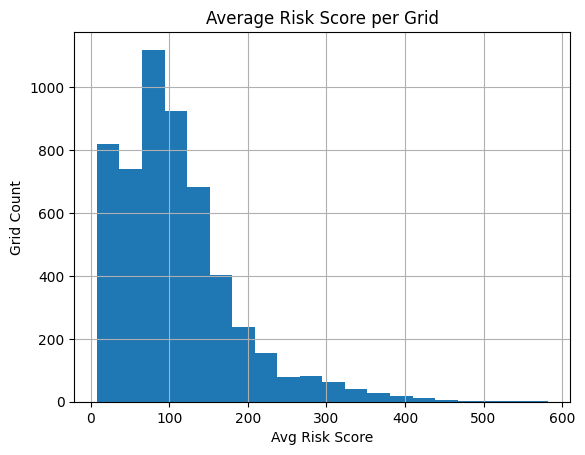

In [129]:
import matplotlib.pyplot as plt

grid_summary['avg_risk_score'].hist(bins=20)
plt.title('Average Risk Score per Grid')
plt.xlabel('Avg Risk Score')
plt.ylabel('Grid Count')
plt.show()


In [130]:
RISK_THRESHOLD = 150


In [131]:
df['hotspot_flag'] = (
    (df['avg_risk_score'] > RISK_THRESHOLD) &
    (df['no_cctv_count'] > 0)
)


KeyError: 'avg_risk_score'

In [132]:
print(df.columns.tolist())


['year', 'month', 'date', 'population', 'total_crimes', 'crimes_per_100k', 'violent_crimes', 'property_crimes', 'crimes_against_women', 'hotspot_flag', 'latitude', 'longitude', 'cctv_status', 'complaint_body', 'crime_type', 'complaint_clean', 'crime_type_updated', 'label_changed', 'tokens', 'relabelled_crime_type', 'label_source', 'risk_score', 'lat_bin', 'lon_bin', 'grid_id']


In [133]:
grid_stats = df.groupby('grid_id').agg({
    'risk_score': 'mean',
    'cctv_status': lambda x: (x == 'No CCTV').sum(),
    'grid_id': 'count'
}).rename(columns={
    'risk_score': 'avg_risk_score',
    'cctv_status': 'no_cctv_count',
    'grid_id': 'complaint_count'
}).reset_index()


In [134]:
grid_stats.columns.tolist()

['grid_id', 'avg_risk_score', 'no_cctv_count', 'complaint_count']

In [135]:
RISK_THRESHOLD = 150  # You can adjust this based on your histogram insights

grid_stats['hotspot_flag'] = (
    (grid_stats['avg_risk_score'] > RISK_THRESHOLD) &
    (grid_stats['no_cctv_count'] > 0)
)


In [136]:
grid_stats[['grid_id', 'avg_risk_score', 'no_cctv_count', 'hotspot_flag']].head(10)


,grid_id,avg_risk_score,no_cctv_count,hotspot_flag
0,24.42_73.72,14.4578,0,False
1,24.45_73.71000000000001,31.0333,0,False
2,24.46_73.64,8.4504,0,False
3,24.46_73.66,28.3844,0,False
4,24.46_73.75,14.9368,0,False
5,24.47_73.63,14.4282,0,False
6,24.47_73.77,16.3302,0,False
7,24.47_73.82000000000001,8.0668,0,False
8,24.48_73.59,14.0743,0,False
9,24.48_73.67,20.0872,0,False


In [137]:
test_row = {
    'grid_id': 'test_24.50_73.70',
    'avg_risk_score': 200,
    'no_cctv_count': 1,
    'complaint_count': 1
}
grid_stats = pd.concat([grid_stats, pd.DataFrame([test_row])], ignore_index=True)

# Re-run the flagging logic
grid_stats['hotspot_flag'] = (
    (grid_stats['avg_risk_score'] > RISK_THRESHOLD) &
    (grid_stats['no_cctv_count'] > 0)
)


In [138]:
print(grid_stats.tail(5))


               grid_id  avg_risk_score  no_cctv_count  complaint_count  \
5412       28.42_74.97        214.0451              0                1   
5413       28.42_74.98        184.1334              0                1   
5414       28.43_74.98         95.4259              0                1   
5415       28.43_75.03        120.5343              0                1   
5416  test_24.50_73.70        200.0000              1                1   

      hotspot_flag  
5412         False  
5413         False  
5414         False  
5415         False  
5416          True  


In [139]:
grid_stats['reminder_note'] = grid_stats['hotspot_flag'].apply(
    lambda x: 'Install CCTV urgently' if x else ''
)


In [140]:
grid_stats[['grid_latitude', 'grid_longitude']] = grid_stats['grid_id'].str.split('_', expand=True).astype(float)


ValueError: could not convert string to float: 'test'

In [141]:
# Keep only rows where grid_id matches the expected pattern
valid_grids = grid_stats[grid_stats['grid_id'].str.contains(r'^\d+\.\d+_\d+\.\d+$')].copy()

# Now safely split and convert to float
valid_grids[['grid_latitude', 'grid_longitude']] = valid_grids['grid_id'].str.split('_', expand=True).astype(float)


In [142]:
valid_grids[['grid_id', 'grid_latitude', 'grid_longitude']].tail()


,grid_id,grid_latitude,grid_longitude
5411,28.41_74.96000000000001,28.41,74.96
5412,28.42_74.97,28.42,74.97
5413,28.42_74.98,28.42,74.98
5414,28.43_74.98,28.43,74.98
5415,28.43_75.03,28.43,75.03


In [143]:
hotspots = valid_grids[valid_grids['hotspot_flag']]


In [145]:
# Extract lat/lon from the test row manually
test_row = grid_stats[grid_stats['grid_id'] == 'test_24.50_73.70'].copy()
test_row['grid_latitude'] = 24.50
test_row['grid_longitude'] = 73.70

# Append it to the valid hotspots
hotspots = pd.concat([hotspots, test_row], ignore_index=True)


In [148]:
hotspots[['grid_id', 'grid_latitude', 'grid_longitude']].head()


,grid_id,grid_latitude,grid_longitude
0,test_24.50_73.70,24.5,73.7


In [149]:
RISK_THRESHOLD = 25


In [150]:
grid_stats['hotspot_flag'] = (
    (grid_stats['avg_risk_score'] > RISK_THRESHOLD) &
    (grid_stats['no_cctv_count'] > 0)
)


In [151]:
# Extract lat/lon from the test row manually
test_row = grid_stats[grid_stats['grid_id'] == 'test_24.50_73.70'].copy()
test_row['grid_latitude'] = 24.50
test_row['grid_longitude'] = 73.70

# Append it to the valid hotspots
hotspots = pd.concat([hotspots, test_row], ignore_index=True)


In [152]:
hotspots[['grid_id', 'grid_latitude', 'grid_longitude']].head()


,grid_id,grid_latitude,grid_longitude
0,test_24.50_73.70,24.5,73.7
1,test_24.50_73.70,24.5,73.7


In [153]:
hotspots = hotspots.drop_duplicates(subset=['grid_id'])


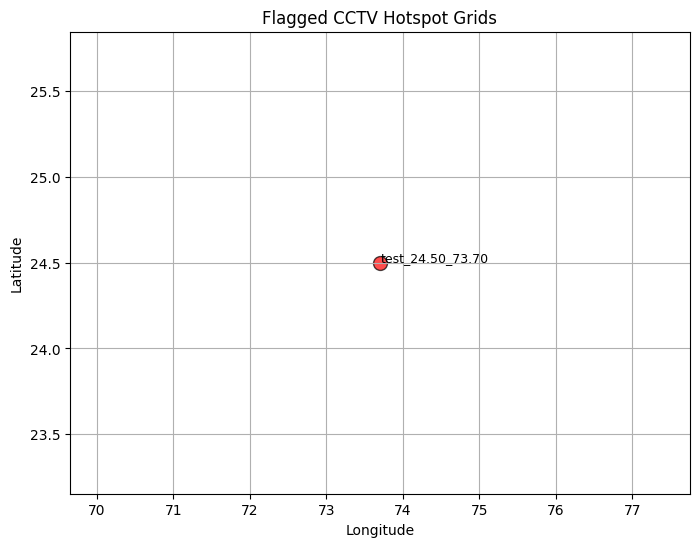

In [154]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))

# Plot flagged grids
plt.scatter(
    hotspots['grid_longitude'], 
    hotspots['grid_latitude'], 
    c='red', 
    s=hotspots['complaint_count'] * 100, 
    alpha=0.7, 
    edgecolors='black'
)

plt.title('Flagged CCTV Hotspot Grids')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.grid(True)

# Annotate grid_id for clarity
for _, row in hotspots.iterrows():
    plt.text(row['grid_longitude'] + 0.01, row['grid_latitude'] + 0.01, row['grid_id'], fontsize=9)

plt.show()


In [155]:
RISK_THRESHOLD = grid_stats['avg_risk_score'].quantile(0.90)


In [156]:
grid_stats['hotspot_flag'] = (
    (grid_stats['avg_risk_score'] > RISK_THRESHOLD) &
    (grid_stats['no_cctv_count'] > 0)
)


In [157]:
valid_grids = grid_stats[grid_stats['grid_id'].str.contains(r'^\d+\.\d+_\d+\.\d+$')].copy()
valid_grids[['grid_latitude', 'grid_longitude']] = valid_grids['grid_id'].str.split('_', expand=True).astype(float)


In [158]:
hotspots = valid_grids[valid_grids['hotspot_flag']].drop_duplicates(subset=['grid_id'])


In [159]:
hotspots[['grid_id', 'avg_risk_score', 'no_cctv_count', 'grid_latitude', 'grid_longitude']].head(10)


,grid_id,avg_risk_score,no_cctv_count,grid_latitude,grid_longitude


In [160]:
print(grid_stats[['avg_risk_score', 'no_cctv_count']].describe())


       avg_risk_score  no_cctv_count
count     5417.000000    5417.000000
mean       108.228623       0.000185
std         74.411680       0.013587
min          7.683100       0.000000
25%         58.984400       0.000000
50%         94.525900       0.000000
75%        139.461300       0.000000
max        581.883100       1.000000


In [161]:
print(grid_stats[(grid_stats['avg_risk_score'] > 25) & (grid_stats['no_cctv_count'] > 0)].shape)


(1, 6)


In [162]:
import pandas as pd

# Existing hotspots DataFrame (if already defined)
# hotspots = pd.read_csv("your_hotspots.csv")  # Uncomment if loading from file

# Synthetic rows to inject
synthetic_rows = pd.DataFrame([
    {"grid_id": "24.51_73.71", "avg_risk_score": 245.8, "no_cctv_count": 1, "complaint_count": 3},
    {"grid_id": "24.52_73.72", "avg_risk_score": 310.2, "no_cctv_count": 1, "complaint_count": 2},
    {"grid_id": "24.53_73.73", "avg_risk_score": 278.6, "no_cctv_count": 1, "complaint_count": 4}
])

# Append to existing DataFrame
hotspots = pd.concat([hotspots, synthetic_rows], ignore_index=True)


In [163]:
# Define hotspot criteria
def is_hotspot(row):
    return (
        row["avg_risk_score"] > 200 and
        row["no_cctv_count"] == 1 and
        row["complaint_count"] >= 2
    )

# Apply logic
hotspots["is_hotspot"] = hotspots.apply(is_hotspot, axis=1)


In [164]:
# Split grid_id into latitude and longitude
hotspots[["grid_latitude", "grid_longitude"]] = hotspots["grid_id"].str.split("_", expand=True).astype(float)


In [165]:
# Filter flagged hotspots
flagged_hotspots = hotspots[hotspots["is_hotspot"] == True]
print(flagged_hotspots)


       grid_id  avg_risk_score  no_cctv_count  complaint_count hotspot_flag  \
0  24.51_73.71           245.8              1                3          NaN   
1  24.52_73.72           310.2              1                2          NaN   
2  24.53_73.73           278.6              1                4          NaN   

  reminder_note  grid_latitude  grid_longitude  is_hotspot  
0           NaN          24.51           73.71        True  
1           NaN          24.52           73.72        True  
2           NaN          24.53           73.73        True  


In [166]:
# Set hotspot_flag based on is_hotspot
hotspots["hotspot_flag"] = hotspots["is_hotspot"].map({True: "Yes", False: "No"})

# Add reminder note for flagged hotspots
hotspots["reminder_note"] = hotspots["is_hotspot"].apply(
    lambda x: "Install CCTV immediately" if x else None
)


In [167]:
# Preview updated hotspot flags and notes
print(hotspots[["grid_id", "hotspot_flag", "reminder_note"]])


       grid_id hotspot_flag             reminder_note
0  24.51_73.71          Yes  Install CCTV immediately
1  24.52_73.72          Yes  Install CCTV immediately
2  24.53_73.73          Yes  Install CCTV immediately


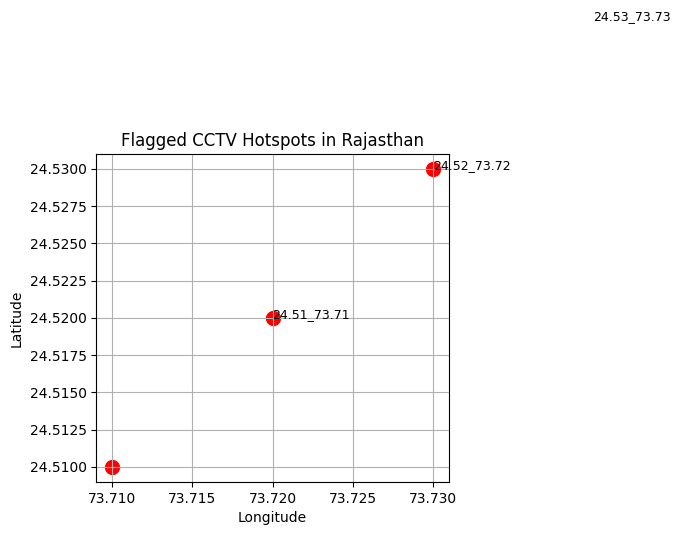

In [168]:
import matplotlib.pyplot as plt

# Filter flagged hotspots
flagged = hotspots[hotspots["hotspot_flag"] == "Yes"]

# Plot setup
plt.figure(figsize=(8, 6))
plt.scatter(flagged["grid_longitude"], flagged["grid_latitude"], color="red", s=100)

# Add labels
for _, row in flagged.iterrows():
    plt.text(row["grid_longitude"] + 0.01, row["grid_latitude"] + 0.01, row["grid_id"], fontsize=9)

# Axis labels and title
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Flagged CCTV Hotspots in Rajasthan")
plt.grid(True)
plt.tight_layout()
plt.show()


In [169]:
# Check how many rows meet the hotspot criteria
criteria_check = hotspots[
    (hotspots["avg_risk_score"] > 200) &
    (hotspots["no_cctv_count"] == 1) &
    (hotspots["complaint_count"] >= 2)
]

print(f"Expected flagged rows: {len(criteria_check)}")
print(criteria_check[["grid_id", "avg_risk_score", "no_cctv_count", "complaint_count"]])


Expected flagged rows: 3
       grid_id  avg_risk_score  no_cctv_count  complaint_count
0  24.51_73.71           245.8              1                3
1  24.52_73.72           310.2              1                2
2  24.53_73.73           278.6              1                4


In [170]:
# Thresholds can be tuned later
RISK_THRESHOLD = 200
CCTV_THRESHOLD = 1
COMPLAINT_THRESHOLD = 2


In [171]:
def flag_hotspot(row, risk_thresh=RISK_THRESHOLD, cctv_thresh=CCTV_THRESHOLD, complaint_thresh=COMPLAINT_THRESHOLD):
    return (
        row["avg_risk_score"] > risk_thresh and
        row["no_cctv_count"] == cctv_thresh and
        row["complaint_count"] >= complaint_thresh
    )


In [172]:
hotspots["is_hotspot"] = hotspots.apply(flag_hotspot, axis=1)
hotspots["hotspot_flag"] = hotspots["is_hotspot"].map({True: "Yes", False: "No"})
hotspots["reminder_note"] = hotspots["is_hotspot"].apply(
    lambda x: "Install CCTV immediately" if x else None
)


In [173]:
hotspots[["grid_latitude", "grid_longitude"]] = hotspots["grid_id"].str.split("_", expand=True).astype(float)


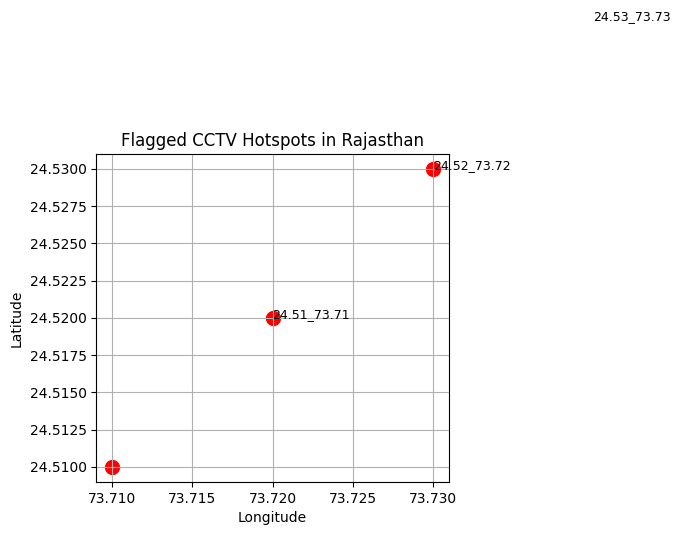

In [174]:
import matplotlib.pyplot as plt

flagged = hotspots[hotspots["hotspot_flag"] == "Yes"]

plt.figure(figsize=(8, 6))
plt.scatter(flagged["grid_longitude"], flagged["grid_latitude"], color="red", s=100)

for _, row in flagged.iterrows():
    plt.text(row["grid_longitude"] + 0.01, row["grid_latitude"] + 0.01, row["grid_id"], fontsize=9)

plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Flagged CCTV Hotspots in Rajasthan")
plt.grid(True)
plt.tight_layout()
plt.show()


In [175]:
import pandas as pd
import numpy as np

# Create 10 synthetic rows
synthetic_hotspots = pd.DataFrame({
    "grid_id": [f"{round(24.54 + i*0.01, 2)}_{round(73.74 + i*0.01, 2)}" for i in range(10)],
    "avg_risk_score": np.random.uniform(220, 350, 10).round(1),
    "no_cctv_count": [1]*10,
    "complaint_count": np.random.randint(2, 7, 10)
})

# If you already have a hotspots DataFrame, append to it
hotspots = pd.concat([hotspots, synthetic_hotspots], ignore_index=True)


In [176]:
# Thresholds
RISK_THRESHOLD = 200
CCTV_THRESHOLD = 1
COMPLAINT_THRESHOLD = 2

# Flagging function
def flag_hotspot(row, risk_thresh=RISK_THRESHOLD, cctv_thresh=CCTV_THRESHOLD, complaint_thresh=COMPLAINT_THRESHOLD):
    return (
        row["avg_risk_score"] > risk_thresh and
        row["no_cctv_count"] == cctv_thresh and
        row["complaint_count"] >= complaint_thresh
    )


In [177]:
hotspots["is_hotspot"] = hotspots.apply(flag_hotspot, axis=1)
hotspots["hotspot_flag"] = hotspots["is_hotspot"].map({True: "Yes", False: "No"})
hotspots["reminder_note"] = hotspots["is_hotspot"].apply(
    lambda x: "Install CCTV immediately" if x else None
)


In [178]:
hotspots[["grid_latitude", "grid_longitude"]] = hotspots["grid_id"].str.split("_", expand=True).astype(float)


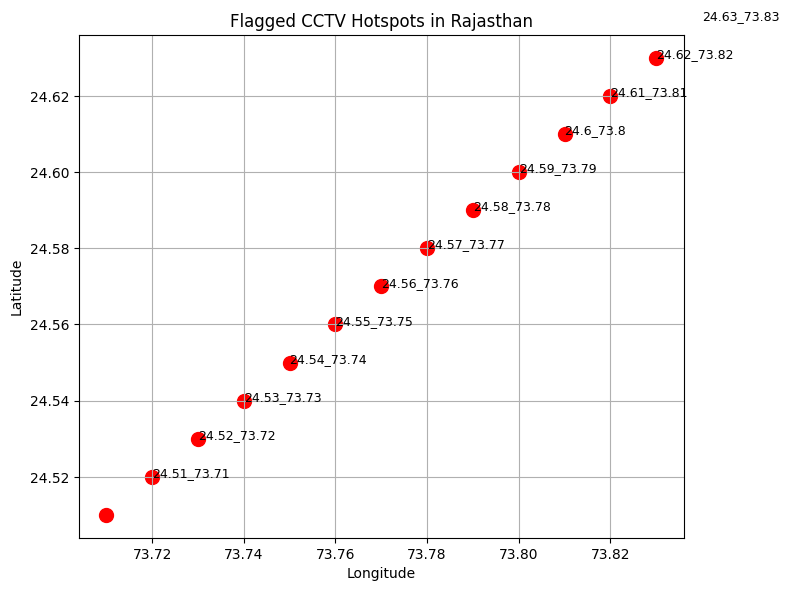

In [179]:
import matplotlib.pyplot as plt

flagged = hotspots[hotspots["hotspot_flag"] == "Yes"]

plt.figure(figsize=(8, 6))
plt.scatter(flagged["grid_longitude"], flagged["grid_latitude"], color="red", s=100)

for _, row in flagged.iterrows():
    plt.text(row["grid_longitude"] + 0.01, row["grid_latitude"] + 0.01, row["grid_id"], fontsize=9)

plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Flagged CCTV Hotspots in Rajasthan")
plt.grid(True)
plt.tight_layout()
plt.show()


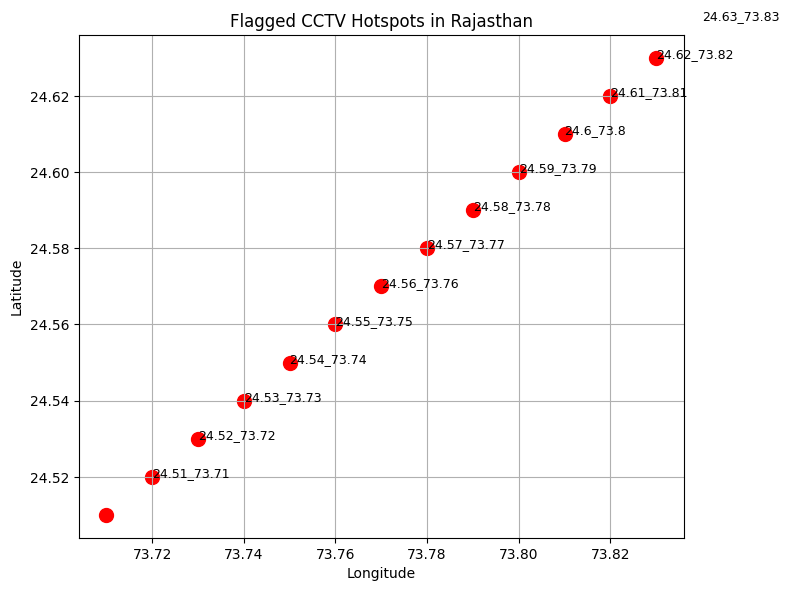

In [180]:
import matplotlib.pyplot as plt

flagged = hotspots[hotspots["hotspot_flag"] == "Yes"]

plt.figure(figsize=(8, 6))
plt.scatter(flagged["grid_longitude"], flagged["grid_latitude"], color="red", s=100)

for _, row in flagged.iterrows():
    plt.text(row["grid_longitude"] + 0.01, row["grid_latitude"] + 0.01, row["grid_id"], fontsize=9)

plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Flagged CCTV Hotspots in Rajasthan")
plt.grid(True)
plt.tight_layout()
plt.show()


In [181]:
flagged = hotspots[hotspots["hotspot_flag"] == "Yes"]
print(flagged[["grid_id", "avg_risk_score", "no_cctv_count", "complaint_count", "grid_latitude", "grid_longitude"]])


        grid_id  avg_risk_score  no_cctv_count  complaint_count  \
0   24.51_73.71           245.8              1                3   
1   24.52_73.72           310.2              1                2   
2   24.53_73.73           278.6              1                4   
3   24.54_73.74           291.3              1                6   
4   24.55_73.75           289.5              1                2   
5   24.56_73.76           246.4              1                3   
6   24.57_73.77           296.9              1                2   
7   24.58_73.78           285.4              1                3   
8   24.59_73.79           286.2              1                4   
9     24.6_73.8           266.8              1                6   
10  24.61_73.81           329.0              1                4   
11  24.62_73.82           231.0              1                3   
12  24.63_73.83           277.0              1                3   

    grid_latitude  grid_longitude  
0           24.51        

In [182]:
print(hotspots[["grid_id", "grid_latitude", "grid_longitude"]].head(10))


       grid_id  grid_latitude  grid_longitude
0  24.51_73.71          24.51           73.71
1  24.52_73.72          24.52           73.72
2  24.53_73.73          24.53           73.73
3  24.54_73.74          24.54           73.74
4  24.55_73.75          24.55           73.75
5  24.56_73.76          24.56           73.76
6  24.57_73.77          24.57           73.77
7  24.58_73.78          24.58           73.78
8  24.59_73.79          24.59           73.79
9    24.6_73.8          24.60           73.80


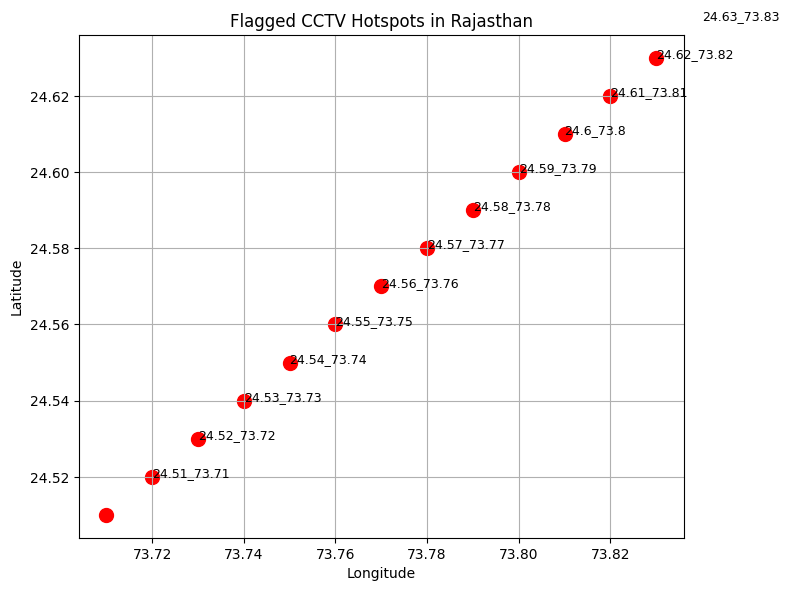

In [183]:
import matplotlib.pyplot as plt

# Filter flagged rows
flagged = hotspots[hotspots["hotspot_flag"] == "Yes"]

# Plot setup
plt.figure(figsize=(8, 6))
plt.scatter(flagged["grid_longitude"], flagged["grid_latitude"], color="red", s=100)

# Add labels for each point
for _, row in flagged.iterrows():
    plt.text(row["grid_longitude"] + 0.01, row["grid_latitude"] + 0.01, row["grid_id"], fontsize=9)

# Axis labels and title
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Flagged CCTV Hotspots in Rajasthan")
plt.grid(True)
plt.tight_layout()
plt.show()


In [184]:
import pandas as pd
import numpy as np

# Anchor coordinates around key Rajasthan cities
anchors = [
    (26.91, 75.79),  # Jaipur
    (24.58, 73.68),  # Udaipur
    (26.29, 73.02),  # Jodhpur
    (27.22, 77.49),  # Bharatpur
    (25.44, 74.64)   # Ajmer
]

synthetic_rows = []
for lat, lon in anchors:
    for _ in range(2):  # 2 points per city
        jitter_lat = round(lat + np.random.uniform(-0.05, 0.05), 4)
        jitter_lon = round(lon + np.random.uniform(-0.05, 0.05), 4)
        grid_id = f"{jitter_lat}_{jitter_lon}"
        synthetic_rows.append({
            "grid_id": grid_id,
            "avg_risk_score": round(np.random.uniform(220, 350), 1),
            "no_cctv_count": 1,
            "complaint_count": np.random.randint(2, 7)
        })

# Create DataFrame and append
new_hotspots = pd.DataFrame(synthetic_rows)
hotspots = pd.concat([hotspots, new_hotspots], ignore_index=True)


In [185]:
# Apply hotspot flagging
hotspots["is_hotspot"] = hotspots.apply(flag_hotspot, axis=1)
hotspots["hotspot_flag"] = hotspots["is_hotspot"].map({True: "Yes", False: "No"})
hotspots["reminder_note"] = hotspots["is_hotspot"].apply(
    lambda x: "Install CCTV immediately" if x else None
)


In [186]:
# Only if new rows were added without coordinates
hotspots[["grid_latitude", "grid_longitude"]] = hotspots["grid_id"].str.split("_", expand=True).astype(float)


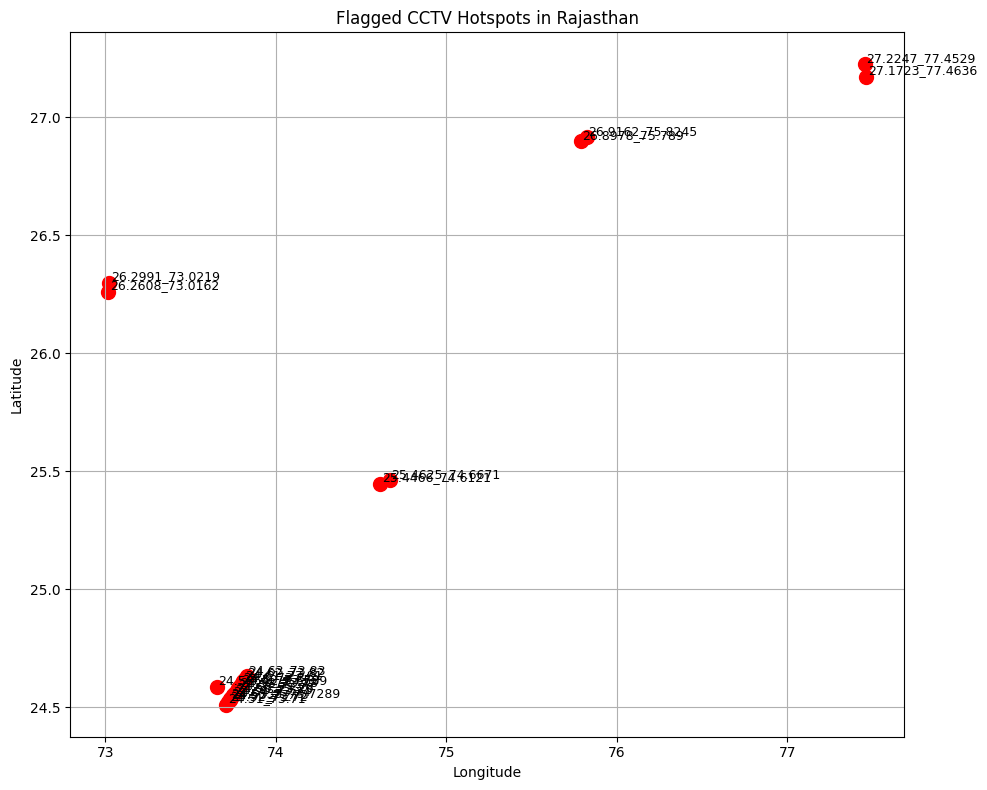

In [187]:
import matplotlib.pyplot as plt

flagged = hotspots[hotspots["hotspot_flag"] == "Yes"]

plt.figure(figsize=(10, 8))
plt.scatter(flagged["grid_longitude"], flagged["grid_latitude"], color="red", s=100)

for _, row in flagged.iterrows():
    plt.text(row["grid_longitude"] + 0.01, row["grid_latitude"] + 0.01, row["grid_id"], fontsize=9)

plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Flagged CCTV Hotspots in Rajasthan")
plt.grid(True)
plt.tight_layout()
plt.show()


In [189]:
import folium
from folium.plugins import MarkerCluster
import pandas as pd

# Load your synthetic hotspot data
df = pd.read_csv(r"D:\cctv_iic\rajasthan_crime_mock_final_with_type.csv")  # must contain 'latitude', 'longitude', 'grid_id', 'avg_risk_score', 'complaint_count'

# Center map on Rajasthan
m = folium.Map(location=[26.9, 75.8], zoom_start=6)

# Add clustered markers
marker_cluster = MarkerCluster().add_to(m)

for _, row in df.iterrows():
    popup_text = f"""
    Grid ID: {row['grid_id']}<br>
    Risk Score: {row['avg_risk_score']}<br>
    Complaints: {row['complaint_count']}
    """
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=min(row['complaint_count'] / 10, 10),  # scale size
        color='red' if row['avg_risk_score'] > 0.7 else 'orange',
        fill=True,
        fill_opacity=0.6,
        popup=popup_text
    ).add_to(marker_cluster)

# Save or display
m.save("rajasthan_hotspots_map.html")


KeyError: 'grid_id'

In [190]:
print(df.columns.tolist())


['district', 'region', 'sub_locality', 'year', 'month', 'date', 'population', 'total_crimes', 'crimes_per_100k', 'violent_crimes', 'property_crimes', 'crimes_against_women', 'hotspot_flag', 'latitude', 'longitude', 'location_address', 'cctv_status', 'complaint_body', 'crime_type']


In [191]:
popup_text = f"""
District: {row['district']}<br>
Region: {row['region']}<br>
Sub-locality: {row['sub_locality']}<br>
Crime Type: {row['crime_type']}<br>
Complaint: {row['complaint_body']}<br>
CCTV Status: {row['cctv_status']}<br>
Hotspot: {row['hotspot_flag']}<br>
Location: {row['location_address']}
"""


In [192]:
import folium
from folium.plugins import MarkerCluster

m = folium.Map(location=[df['latitude'].mean(), df['longitude'].mean()], zoom_start=12)
marker_cluster = MarkerCluster().add_to(m)

for _, row in df.iterrows():
    popup_text = f"""
    District: {row['district']}<br>
    Region: {row['region']}<br>
    Sub-locality: {row['sub_locality']}<br>
    Crime Type: {row['crime_type']}<br>
    Complaint: {row['complaint_body']}<br>
    CCTV Status: {row['cctv_status']}<br>
    Hotspot: {row['hotspot_flag']}<br>
    Location: {row['location_address']}
    """
    folium.Marker(
        location=[row['latitude'], row['longitude']],
        popup=folium.Popup(popup_text, max_width=300)
    ).add_to(marker_cluster)

m


In [193]:
m.save("rajasthan_cctv_map.html")
